# Self-Driving Car Engineer Nanodegree


## Project: **Advanced Finding Lane Lines on the Road** 
***
This project focused on lane finding from a dashboard mounted camera. First, an image analysis pipeline is developed using a series of individual images, and then applied a video stream to assess the performance of lane finding with an environment with curved road features.

The program flow is as follows:
* Perform camera calibration
* Perform distortion correction
* Perform top-down perspective transform
* Investigate color/gradient threshold transformations
* Extract lane line features from top-down image
* Calculate lane curvature through polynomial fit
* Overlay lane visualization on video frames and print out metrics

### Import Packages

In [1]:
#importing some useful packages
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import math
import glob
import pickle

%matplotlib inline

### Read in example image and verify shape

Image type: <class 'numpy.ndarray'>
Image shape: (720, 1280, 3)


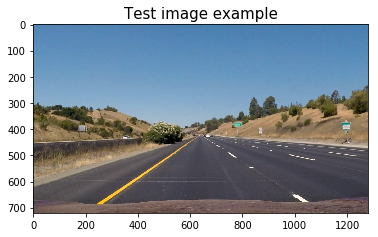

In [2]:
# Read in a test image

test_image = mpimg.imread('test_images/straight_lines1.jpg')

# Check image type, shape

print('Image type:', type(test_image))
print('Image shape:', test_image.shape)
plt.title('Test image example', fontsize=15)
plt.imshow(test_image)

### Define Useful Functions

In [3]:
# Define a function to plot images for comparision as needed to show the result of transformations

def plot_two_images(img1, img2, title_1, title_2, outname = None, save = None):
    
    # Plot images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))

    ax1.imshow(img1)
    ax1.set_title(title_1, fontsize=30)
    
    ax1.set_xlabel('x dimension', fontsize = 20)
    ax1.set_ylabel('y dimension', fontsize = 20)

    ax2.imshow(img2)
    ax2.set_title(title_2, fontsize=30)
    
    ax2.set_xlabel('x dimension', fontsize = 20)
    ax2.set_ylabel('y dimension', fontsize = 20)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
    if save == True:
        plt.savefig('./output_images/' + outname + '.jpg')
    
    plt.show
    
    return

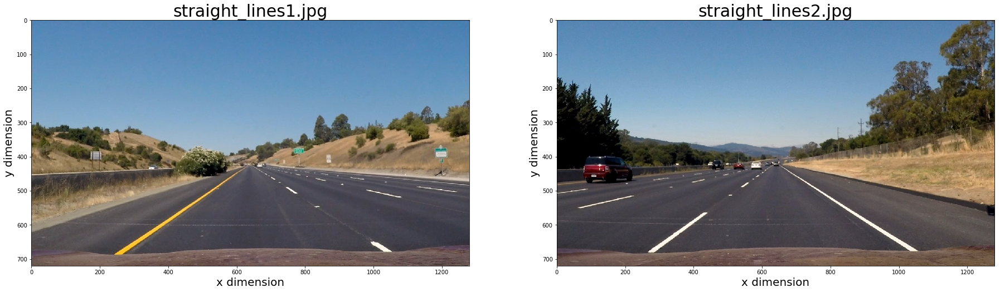

In [4]:
# Test image function

image_test1 = mpimg.imread('test_images/straight_lines1.jpg')
image_test2 = mpimg.imread('test_images/straight_lines2.jpg')

plot_two_images(image_test1, image_test2, title_1 = 'straight_lines1.jpg', title_2 = 'straight_lines2.jpg', outname = 'imageplottest', save = True)

### 1. Camera Calibration
***
ChessBoard calibration images are read in, then cv2 functions are used to identify the corners within the ChessBoard calibration images. The calibration information is then saved as a calibration file which can be used later when applying distortion correction.

In [5]:
# Define a set of object points
objp = np.zeros((6*9, 3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Define arrays to store object (3D space) and image (2D space) points from imported images
objpoints = []
imgpoints = []

# print a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Iterate through the list, searching for chesseboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Use cv2 to find chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    
    if ret == True:
        print('working on ', fname)
        objpoints.append(objp)
        imgpoints.append(corners)
        
        # Draw the found corners, save images to the output_images folder
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        write_name = 'corners_found' + str(idx) + '.jpg'
        cv2.imwrite('./output_images/chessboard_images/' + write_name, img)
        
# Load image for reference
img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Perform camera calibration for the given object and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Save the calibration file
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("./camera_cal/calibration_pickle.p", "wb"))

working on  ./camera_cal\calibration10.jpg
working on  ./camera_cal\calibration11.jpg
working on  ./camera_cal\calibration12.jpg
working on  ./camera_cal\calibration13.jpg
working on  ./camera_cal\calibration14.jpg
working on  ./camera_cal\calibration15.jpg
working on  ./camera_cal\calibration16.jpg
working on  ./camera_cal\calibration17.jpg
working on  ./camera_cal\calibration18.jpg
working on  ./camera_cal\calibration19.jpg
working on  ./camera_cal\calibration2.jpg
working on  ./camera_cal\calibration20.jpg
working on  ./camera_cal\calibration3.jpg
working on  ./camera_cal\calibration6.jpg
working on  ./camera_cal\calibration7.jpg
working on  ./camera_cal\calibration8.jpg
working on  ./camera_cal\calibration9.jpg


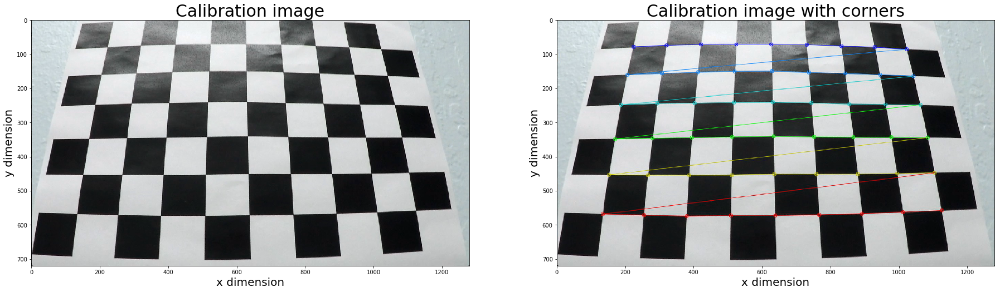

In [6]:
# Plot an example of the calibration image and after finding corners

cal_img_3 = cv2.imread('./camera_cal/calibration3.jpg')
foundlines_img_13 = cv2.imread('./output_images/chessboard_images/corners_found13.jpg')

plot_two_images(cal_img_3, foundlines_img_13,
                title_1 = 'Calibration image', title_2 = 'Calibration image with corners',
                outname = 'calibration_image_with_corners', save = True)

### Define Undistortion Function
***
The camera calibration file is used to undistort the images.

In [7]:
# Read in the saved camera matrix and distortion coefficients

dist_pickle = pickle.load(open("camera_cal/calibration_pickle.p", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Read in a test image
img = cv2.imread('./camera_cal/calibration3.jpg')

# Define chessboard size parameters, nx (number of inside corners in x) and ny (number of inside corners in y)

nx = 9
ny = 6

def corners_unwarp(img, nx, ny, mtx, dist):
    
    # Undistort using mtx and dist
    img_size = (img.shape[1], img.shape[0])
    
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    # Darw corners if corners are found
    if ret == True:
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
        # Define 4 source points src = np.float32([[,],[,],[,],[,]])
        # Detected corners found using the automatic corner detection
        offset = 100
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
            
        # Define 4 destination points dst = np.float32([[,],[,],[,],[,]])
        dst = np.float32([[offset, offset],[img_size[0]-offset, offset],[img_size[0]-offset, img_size[1]-offset],[offset, img_size[1]-offset]])
            
        # Use cv2.getPerspectiveTransform() to get M, the transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
            
        # Use cv2.warpPerspective() to warp your image to a top-down view
        warped = cv2.warpPerspective(undist, M, img_size)
    
    return warped, M

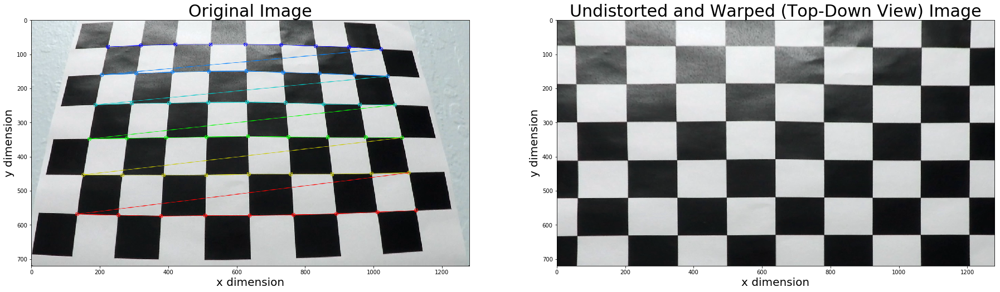

In [8]:
# Test the undistort and top-down transformation on a calibration image

top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)

plot_two_images(img, top_down,
                title_1 = 'Original Image', title_2 = 'Undistorted and Warped (Top-Down View) Image',
                outname = 'undistort_chessboard', save = True)

### 3. Color/gradient threshold

In [9]:
# Define a stand-alone function to perform the camera distortion correction

def undistort(image):
    
    dist_pickle = pickle.load(open("camera_cal/calibration_pickle.p", "rb"))
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    
    undistorted = cv2.undistort(image, mtx, dist, None, mtx)
    
    return undistorted

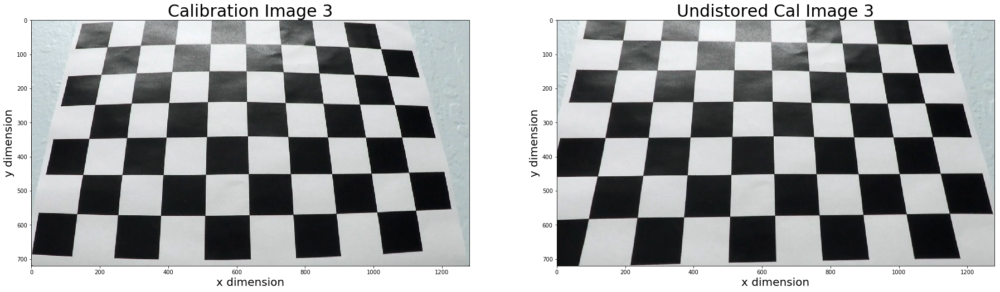

In [10]:
# Plot an example of a raw and undistored image

cal_img3 = cv2.imread('./camera_cal/calibration3.jpg')

cal_img3_undist = undistort(cal_img3)

plot_two_images(cal_img3, cal_img3_undist,
                title_1 = 'Calibration Image 3', title_2 = 'Undistored Cal Image 3',
                outname = 'cal_image_undistorted', save = True)

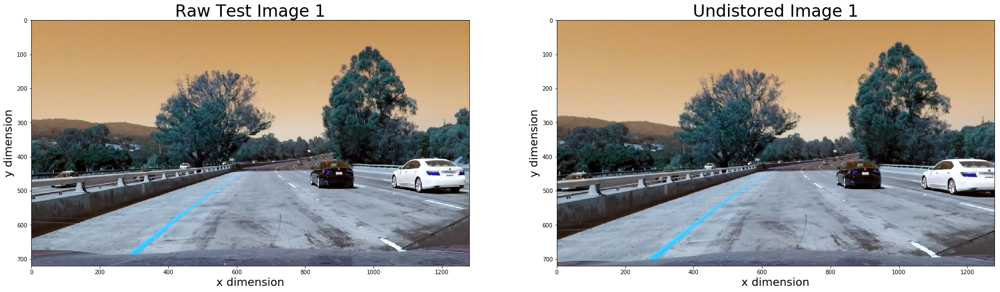

In [11]:
# Plot an example of a raw and undistored image

img_test1 = cv2.imread('./test_images/test1.jpg')

img_test1_undist = undistort(img_test1)

plot_two_images(img_test1, img_test1_undist,
                title_1 = 'Raw Test Image 1', title_2 = 'Undistored Image 1',
                outname = 'test_image_undistorted', save = True)

In [12]:
# Define a stand-alone function to perform the top-down perspective warp

def perspective_transform(image):

    img_size = (image.shape[1], image.shape[0])

    preprocessImage = np.zeros_like(img[:,:,0])

    bot_width = 0.75 # percent of bottom trapizoid height
    mid_width = 0.08 # percent of middle trapizoid height
    height_pct = 0.61 # percent for trapizoid width
    bottom_trim = 0.95 # percent from top to bottom to avoid car hood

    src = np.float32([[img.shape[1] * (0.5 - mid_width / 2), img.shape[0] * height_pct],
                      [img.shape[1] * (0.5 + mid_width / 2), img.shape[0] * height_pct],
                      [img.shape[1] * (0.5 + bot_width / 2), img.shape[0] * bottom_trim],
                      [img.shape[1] * (0.5 - bot_width / 2), img.shape[0] * bottom_trim]])

    offset = img_size[0] * 0.25

    dst = np.float32([[offset, 0], [img_size[0]-offset, 0], [img_size[0]-offset, img_size[1]], [offset, img_size[1]]])
    
    # Define topdown perspective transform

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warped = cv2.warpPerspective(image, M, img_size, flags = cv2.INTER_LINEAR)
    
    print("src array: ", src)
    print("dst array: ", dst)

    return warped


src array:  [[  588.79998779   439.20001221]
 [  691.20001221   439.20001221]
 [ 1120.           684.        ]
 [  160.           684.        ]]
dst array:  [[ 320.    0.]
 [ 960.    0.]
 [ 960.  720.]
 [ 320.  720.]]


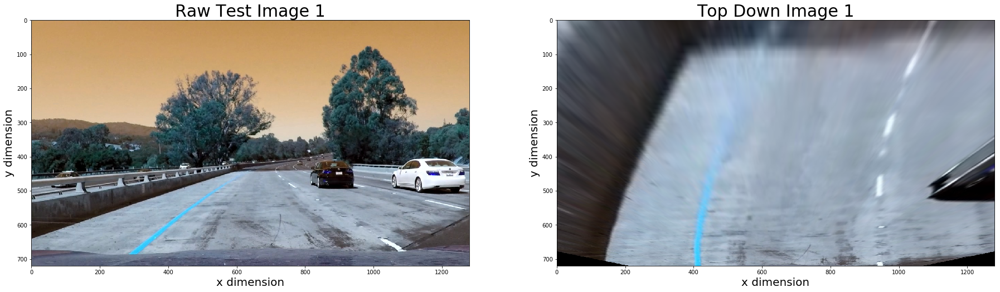

In [13]:
# Plot an example of a raw and undistored image

img_test1 = cv2.imread('./test_images/test1.jpg')

img_test1_undist = undistort(img_test1)
img_topdown = perspective_transform(img_test1_undist)

plot_two_images(img_test1, img_topdown,
                title_1 = 'Raw Test Image 1', title_2 = 'Top Down Image 1',
                outname = 'test_image_topdown', save = True)

In [14]:
# Hard code src and dst coordinates

src = np.float32([[588, 439],
                [691, 439],
                [1120, 684],
                [160, 684]])    

dst = np.float32([[320, 0],
                [960, 0],
                [960, 720],
                [320, 720]])

In [15]:
def topdown(image):
    
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    
    return warped

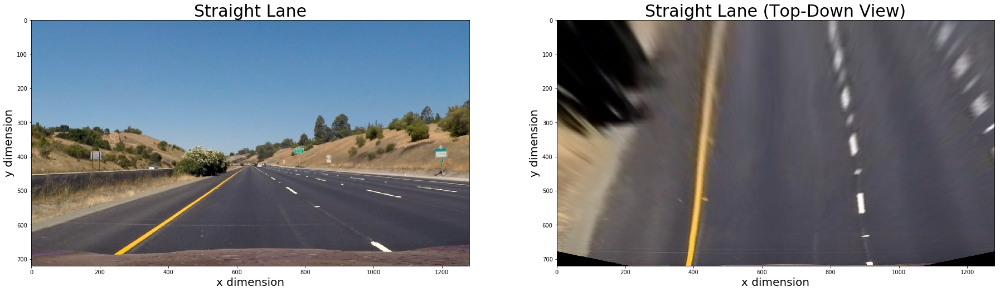

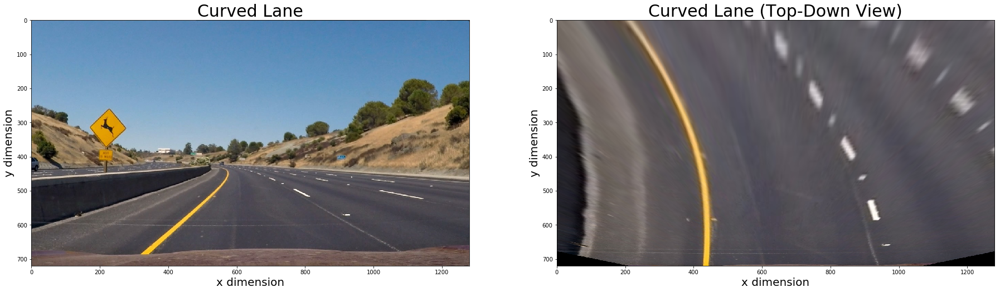

In [16]:
# Test the perspective transform on different lane types: straight vs. curved
# Print out example images of straight vs curved lanes

straight_lane_test = mpimg.imread('test_images/straight_lines1.jpg')
curved_lane_test = mpimg.imread('test_images/test2.jpg')

warp_test_straight = topdown(straight_lane_test)
warp_test_curved = topdown(curved_lane_test)

plot_two_images(straight_lane_test, warp_test_straight,
                title_1 = 'Straight Lane', title_2 = 'Straight Lane (Top-Down View)',
                outname = 'straight_lane_warp_test', save = True)

plot_two_images(curved_lane_test, warp_test_curved,
                title_1 = 'Curved Lane', title_2 = 'Curved Lane (Top-Down View)',
                outname = 'curved_lane_warp_test', save = True)

In [17]:
# Define a stand-alone unwarping function

def unwarp(image):
    
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    newwarp = cv2.warpPerspective(image, Minv, (1280, 720))
    
    return newwarp

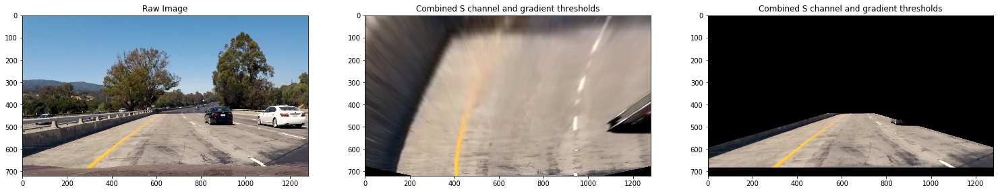

In [18]:
# Test the warping and unwarping of an image

img_test1 = mpimg.imread('test_images/test1.jpg')
undist1 = undistort(img_test1)
warped1 = topdown(undist1)
unwarped1 = unwarp(warped1)

# Plotting thresholded images
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))

ax1.set_title('Raw Image')
ax1.imshow(img_test1)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(warped1, cmap='gray')

ax3.set_title('Combined S channel and gradient thresholds')
ax3.imshow(unwarped1, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'warp_unwarp_example' + '.jpg')

In [19]:
# Run the topdown transform on all test images

images = glob.glob('./test_images/test*.jpg')

for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    img = undistort(img)
    img = topdown(img)
    
    result = img
    
    write_name = './transformation_test/trans_test' + str(idx) + '.jpg'
    cv2.imwrite(write_name, result)

### Sobel Functions
***
Define the Sobel threshold transformation function.

In [20]:
# Define the Absolute Sobel Threshold Function that applies Sobel x or y, and then takes an absolute value and applies a threshold.

def abs_sobel_thresh(img, orient='x', sobel_kernel = 5, thresh = (0, 255)):
    
    # Convert image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        
    # Take the absolute value of the derivative or gradient
    if orient == 'x':
        abs_sobel = np.absolute(sobelx)
    if orient == 'y':
        abs_sobel = np.absolute(sobely)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    
    # Create a mask of 1's where the scaled gradient magnitude 
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    return binary_output

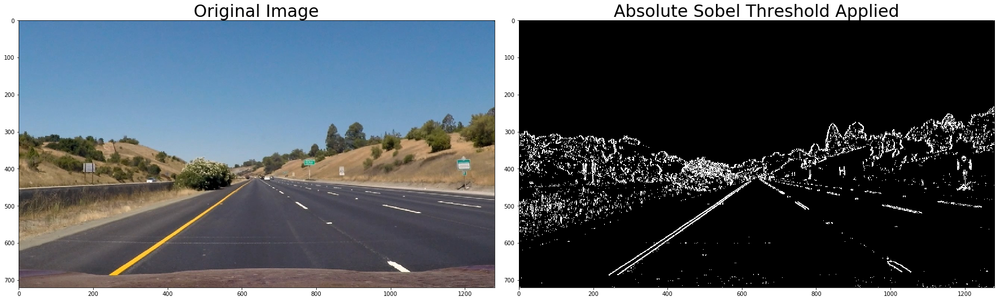

In [21]:
# Test the abs_sobel_thresh function
# Read in a test image and grayscale it
image_test = mpimg.imread('test_images/straight_lines1.jpg')
    
# Run the function to test
grad_binary = abs_sobel_thresh(image_test, orient='x', thresh = (20, 250))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Absolute Sobel Threshold Applied', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'abs_soble_thresh_test' + '.jpg')

In [22]:
# Define and test the Magnitude Sobel Threshold Function.

def mag_thresh(image, sobel_kernel = 3, mag_thresh = (0, 255)):
    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = sobel_kernel)
    
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag / scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(gradmag)
    
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag < mag_thresh[1])] = 1
    
    return binary_output

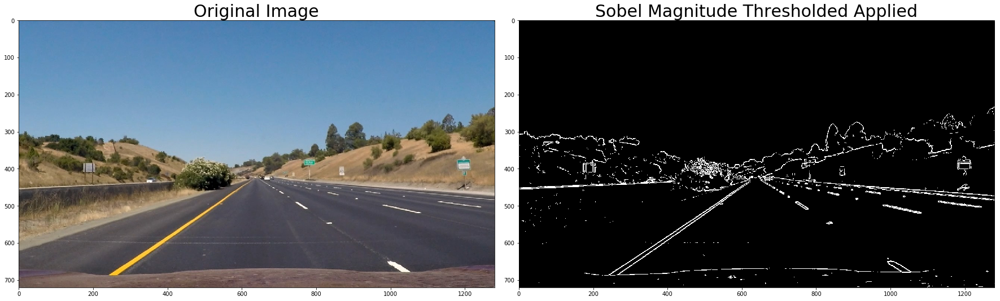

In [23]:
# Test the mag_thresh function on test_image    

mag_thresh_test = mag_thresh(image_test, sobel_kernel = 3, mag_thresh = (50, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(mag_thresh_test, cmap='gray')
ax2.set_title('Sobel Magnitude Thresholded Applied', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'mag_thresh_test' + '.jpg')

### Color Filtering and Transformations
***
First, the ChessBoard calibration images are read into a function and cv2 functions are used to identify the corners within the ChessBoard calibration images. The calibration information is then saved as a calibration file which can be used later when applying distortion correction.

In [24]:
# Define HLS Color Threshold Function that thresholds the S-channel of HLS and test it.

def hls_select(img, thresh=(0, 255)):
    
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    # Apply a threshold to the S channel
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    return binary_output

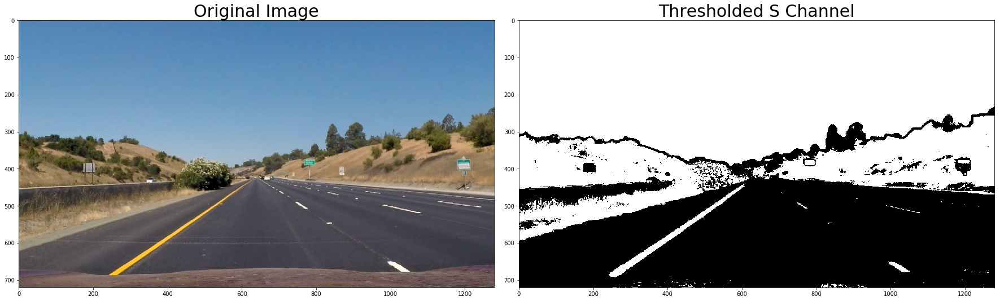

In [25]:
# Test the hls_select function

hls_binary = hls_select(image_test, thresh=(50, 255))

# Read in a test image
#image = mpimg.imread('test_images/straight_lines1.jpg') 

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(hls_binary, cmap='gray')

ax2.set_title('Thresholded S Channel', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'hls_binary_test' + '.jpg')

In [26]:
# Define a color threshold function with HLS and HSV and test it.

def color_threshold(image, sthresh = (0,255), vthresh=(0,255)):
    
    hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= sthresh[0]) & (s_channel <= sthresh[1])] = 1
    
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    v_channel = hsv[:,:,2]
    v_binary = np.zeros_like(v_channel)
    v_binary[(v_channel >= vthresh[0]) & (v_channel <= vthresh[1])] = 1
    
    output = np.zeros_like(s_channel)
    output[(s_binary == 1) & (v_binary == 1)] = 1
    
    return output

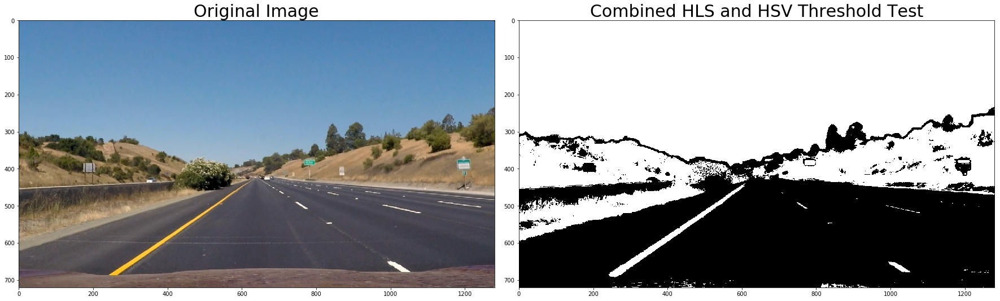

In [27]:
# Test the color_threshold function

# Read in a test image
#image_test = mpimg.imread('test_images/straight_lines1.jpg')

thresh_test = color_threshold(image_test, sthresh = (50,255), vthresh = (50,255))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()

ax1.imshow(image_test)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(thresh_test, cmap='gray')
ax2.set_title('Combined HLS and HSV Threshold Test', fontsize=30)

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'color_thresh_test' + '.jpg')

### Binary Image for Pipeline Funciton
Define the final pipeline for producing the binary output image.

In [28]:
def pipeline_color(img, s_thresh=(170, 255), sx_thresh=(20, 100), sobel_kernel=9):
    
    # Convert to HLS color space and separate the S channel
    # Note: img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]

    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    #sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = sobel_kernel)
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255 * abs_sobelx / np.max(abs_sobelx))
    
    sxbinary = np.zeros_like(scaled_sobel)
    #sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    s_binary = np.zeros_like(s_channel)
    #s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return combined_binary

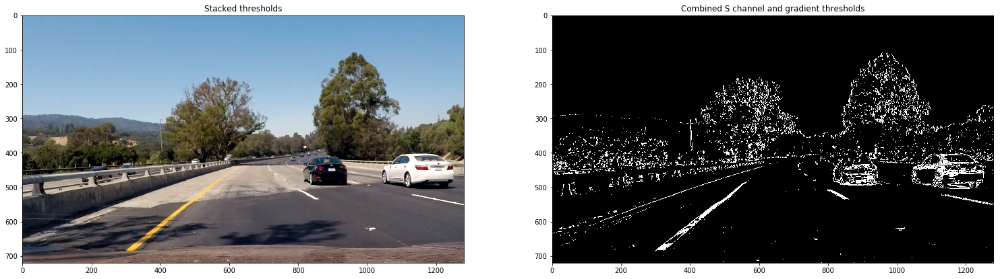

In [29]:
img_test = mpimg.imread('test_images/test4.jpg')    
result = pipeline_color(img_test, s_thresh=(200, 255), sx_thresh=(30, 100), sobel_kernel=1)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img_test)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(result, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'color_pipeline' + '.jpg')

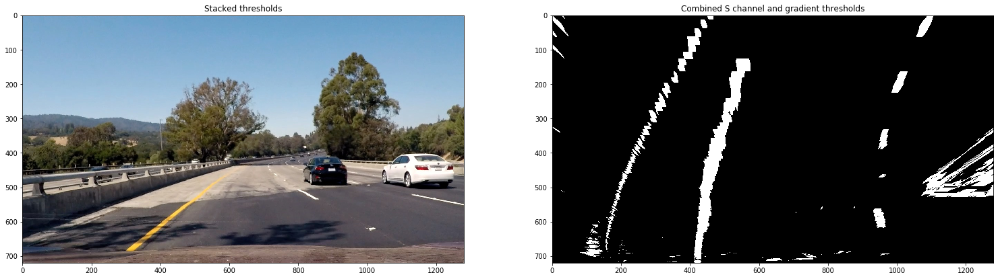

In [30]:
# Test the creation of binary_warped image including top-down transformation

img_test4 = mpimg.imread('test_images/test4.jpg')
result4 = pipeline_color(img_test4, s_thresh=(120, 255), sx_thresh=(35, 250), sobel_kernel=1)
warped4 = topdown(result4)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img_test4)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(warped4, cmap='gray')

plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.savefig('./output_images/' + 'binary_warped_example' + '.jpg')

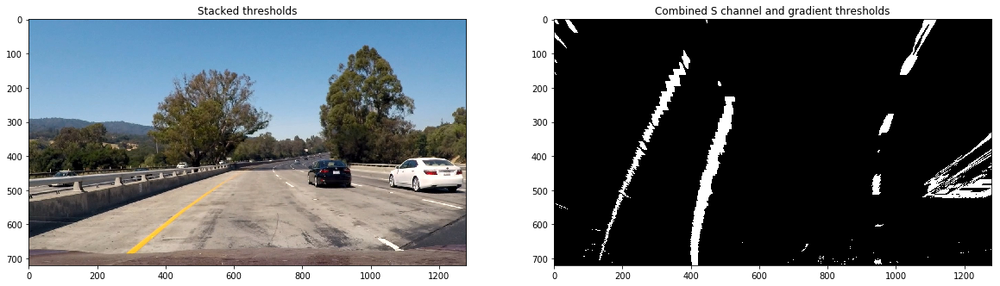

In [31]:
# Test the creation of binary_warped image including top-down transformation

img_test1 = mpimg.imread('test_images/test1.jpg')
result1 = pipeline_color(img_test1, s_thresh=(120, 255), sx_thresh=(30, 100), sobel_kernel=1)
warped1 = topdown(result1)

# Plotting thresholded images
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title('Stacked thresholds')
ax1.imshow(img_test1)

ax2.set_title('Combined S channel and gradient thresholds')
ax2.imshow(warped1, cmap='gray')

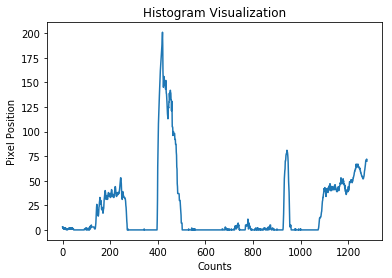

In [32]:
# Investigate the creation of a histogram of a binary_warped image

img_test1 = mpimg.imread('test_images/test1.jpg')
undist1 = undistort(img_test1)
binary_warped1 = pipeline_color(undist1, s_thresh=(120, 255), sx_thresh=(30, 100), sobel_kernel=1)
warped_hist = topdown(binary_warped1)

def histogram_vis(image):
    
    histogram = np.sum(image[int(image.shape[0]//2):,:], axis=0)
    
    plt.title('Histogram Visualization')
    plt.xlabel('Counts')
    plt.ylabel('Pixel Position')
    plt.plot(histogram)
    plt.savefig('./output_images/histogram_visualization.jpg')
    
    return

histogram_vis(warped_hist)

### Define Lane Finding

In [33]:
def transformImage(image, src, dst):
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(image, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    return warped

# Transformation coordinates
src = np.float32([[693, 455],[1075, 700],[230, 700],[588, 455]])
dst = np.float32([[950, 0],[950, 720],[250, 720],[250, 0]])

### 5. Detect lane lines

In [34]:
# Read in a thresholded image
#warped = mpimg.imread('./examples/warped_example.jpg')

# window settings
window_width = 50 
window_height = 80 # Break image into 9 vertical layers since image height is 720
margin = 100 # How much to slide left and right for searching

def window_mask(width, height, img_ref, center,level):
    output = np.zeros_like(img_ref)
    output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
    return output

def find_window_centroids(image, window_width, window_height, margin):
    
    window_centroids = [] # Store the (left,right) window centroid positions per level
    window = np.ones(window_width) # Create our window template that we will use for convolutions
    
    # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
    # and then np.convolve the vertical image slice with the window template 
    
    # Sum quarter bottom of image to get slice, could use a different ratio
    l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
    l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
    r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
    r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
    
    # Add what we found for the first layer
    window_centroids.append((l_center,r_center))
    
    # Go through each layer looking for max pixel locations
    for level in range(1,(int)(warped.shape[0]/window_height)):
	    # convolve the window into the vertical slice of the image
	    image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
	    conv_signal = np.convolve(window, image_layer)
	    # Find the best left centroid by using past left center as a reference
	    # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
	    offset = window_width/2
	    l_min_index = int(max(l_center+offset-margin,0))
	    l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
	    l_center = np.argmax(conv_signal[l_min_index:l_max_index])+l_min_index-offset
	    # Find the best right centroid by using past right center as a reference
	    r_min_index = int(max(r_center+offset-margin,0))
	    r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
	    r_center = np.argmax(conv_signal[r_min_index:r_max_index])+r_min_index-offset
	    # Add what we found for that layer
	    window_centroids.append((l_center,r_center))

    return window_centroids

In [35]:
cen_test1 = mpimg.imread('test_images/test2.jpg')
undist1 = undistort(cen_test1)
binary1 = pipeline_color(undist1, s_thresh=(120, 255), sx_thresh=(30, 100), sobel_kernel=1)
warped = topdown(binary1)

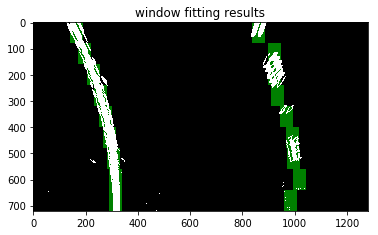

In [36]:
window_centroids = find_window_centroids(warped, window_width, window_height, margin)

# If we found any window centers
if len(window_centroids) > 0:

    # Points used to draw all the left and right windows
    l_points = np.zeros_like(warped)
    r_points = np.zeros_like(warped)

    # Go through each level and draw the windows 	
    for level in range(0,len(window_centroids)):
        
        # Window_mask is a function to draw window areas
	    l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
	    r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
	    
        # Add graphic points from window mask here to total pixels found 
	    l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
	    r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

    # Draw the results
    template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
    zero_channel = np.zeros_like(template) # create a zero color channle 
    template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
    warpage= np.dstack((warped, warped, warped))*255 # making the original road pixels 3 color channels
    output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results
 
# If no window centers found, just display orginal road image
else:
    output = np.array(cv2.merge((warped,warped,warped)),np.uint8)

# Display the final results
#plt.imshow(warped)
plt.imshow(output)
plt.title('window fitting results')
plt.show()

In [37]:
def findWindowCentroids(img, window_width, rows, margin=40, last_centroids=[0, 0]):
    
    window_centroids = []
    
    window_height = int(img.shape[0] / rows)
    half_image_width = int(img.shape[1]/2)
    left_lane_x = last_centroids[0]
    right_lane_x = last_centroids[1]
    
    left_start = 0 if left_lane_x == 0 else left_lane_x - margin
    left_end = half_image_width - 1 if left_lane_x == 0 else left_lane_x + margin
    right_start = half_image_width if right_lane_x == 0 else right_lane_x - margin
    right_end = img.shape[1] - 1 if right_lane_x == 0 else right_lane_x + margin
    
    for i, y_window_pos in enumerate(range(img.shape[0], 0, -window_height)):
        row_image = img[y_window_pos - window_height: y_window_pos]
        conv_signal = np.convolve(np.ones(window_width), np.sum(row_image, axis=0))
            
        if window_centroids:
            left_lane_x, right_lane_x = window_centroids[-1]
            left_start = left_lane_x - margin
            left_end = left_lane_x + margin
            right_start = right_lane_x - margin
            right_end = right_lane_x + margin

        if np.max(conv_signal[left_start:left_end]) > 0:
            left_lane_x = np.argmax(conv_signal[left_start:left_end]) + left_start
        
        if np.max(conv_signal[right_start:right_end]) > 0:
            right_lane_x = np.argmax(conv_signal[right_start:right_end]) + right_start
        
        window_centroids.append((left_lane_x,right_lane_x))

    return np.array(window_centroids) - window_width / 2

def updateMask(mask, window_width, rows, image_shape, center, level):
    window_height = image_shape[0] / rows
    height_start = int(image_shape[0] - (level + 1) * window_height)
    height_end = int(image_shape[0] - level * window_height)
    width_start = max(0, int(center - window_width / 2))
    width_end = min(int(center + window_width / 2), image_shape[1])
    mask[height_start:height_end, width_start:width_end] = 255

def getWindowOverlayImage(image, window_centroids, window_width, rows):
    
    zeros = np.zeros_like(image)
    mask = np.zeros_like(image)
    
    # Go through each level and update window mask
    for i, centroid in enumerate(window_centroids):
        updateMask(mask, window_width, rows, image.shape, centroid[0], i)
        updateMask(mask, window_width, rows, image.shape, centroid[1], i)

    # Make window pixels green
    windows = np.array(cv2.merge((zeros, np.array(mask), zeros)), np.uint8)
    
    # Overlay the orignal road image with window results
    return cv2.addWeighted(cv2.cvtColor(image, cv2.COLOR_GRAY2RGB), 0.5, windows, 0.5, 0.0)

def getLaneImages(images, window_width, window_rows):
    
    output_images = []
    output_centroids = []
    
    for image in images:
        centroids = findWindowCentroids(image, window_width, window_rows)
        output_images.append(getWindowOverlayImage(image, centroids, window_width, window_rows))
        output_centroids.append(centroids)
    
    return output_images, output_centroids

### 6. Determine the lane curvature

In [38]:
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
def textOverlay(img, res_yvals, yvals, leftx, left_fitx, right_fitx):
    
    curve_fit_cr = np.polyfit(np.array(res_yvals, np.float32)*ym_per_pix, np.array(leftx, np.float32) * xm_per_pix, 2)
    curverad = ((1 + (2 * curve_fit_cr[0] * yvals[-1] * ym_per_pix + curve_fit_cr[1])**2)**1.5) / np.absolute(2*curve_fit_cr[0])
    
    camera_center = (left_fitx[-1] + right_fitx[-1]) / 2
    center_diff = (camera_center-img.shape[1]/2) * xm_per_pix
    
    side_pos = 'left'
    if center_diff <= 0:
        side_pos = 'right'
    
    cv2.putText(img, 'Radius of Curvature = ' + str(round(curverad, 3)) + 'm', (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(img, 'Vehicle is ' + str(abs(round(center_diff,3))) + 'm ' + side_pos + ' of center', (50,100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    

def drawLane(img, centroids, transformed):
    
    img = img.copy()
    
    leftx = [i[0] for i in centroids]
    rightx = [i[1] for i in centroids]
    
    yvals = range(img.shape[0])
    res_yvals = np.arange(img.shape[0]-(img.shape[0]/16), 0, -img.shape[0] / len(centroids) )
    
    # f(x) = Ax**2 + Bx + C
    left_fit = np.polyfit(res_yvals, leftx, 2)
    left_fitx = np.array(left_fit[0] * yvals * yvals +  left_fit[1] * yvals + left_fit[2], np.int32)

    right_fit = np.polyfit(res_yvals, rightx, 2)
    right_fitx = np.array(right_fit[0] * yvals * yvals +  right_fit[1] * yvals + right_fit[2], np.int32)
    
    textOverlay(img, res_yvals, yvals, leftx, left_fitx, right_fitx)
    
    Minv = cv2.getPerspectiveTransform(dst, src)
    
    warp_zero = np.zeros_like(transformed).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
    # Combine the result with the original image

    return cv2.addWeighted(img, 1, newwarp, 0.3, 0)

### 7. Video

In [39]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
from collections import deque
import cProfile

min_left_lane = []
max_left_lane = []

min_right_lane = []
max_right_lane = []

def processImage(image):
    img_undistorted = undistort(image)
    img_thresholded = pipeline_color(img_undistorted, s_thresh=(120, 255), sx_thresh=(30, 100), sobel_kernel=1)
    img_transformed = topdown(img_thresholded)
    centroids = findWindowCentroids(img_transformed, 50, 8, 100)
    #centroids = findWindowCentroids(img_transformed, 50, 80, margin = 100)
    #centroids = find_window_centroids(img_transformed, window_width = 50, window_height = 80, margin = 100)
    
    # Append found features to centroid lists
    
    min_left_lane.append(centroids[:,0].min())
    max_left_lane.append(centroids[:,0].max())
    
    min_right_lane.append(centroids[:,1].min())
    max_right_lane.append(centroids[:,1].max())
    
    return drawLane(img_undistorted, centroids, img_transformed)
    
input_video = './project_video.mp4'
output_video = './output_video/out_project_video_franktest.mp4'

clip = VideoFileClip(input_video)
video_clip = clip.fl_image(processImage)
video_clip.write_videofile(output_video, audio=False)

[MoviePy] >>>> Building video ./output_video/out_project_video_franktest.mp4
[MoviePy] Writing video ./output_video/out_project_video_franktest.mp4


  8%|██████                                                                          | 95/1261 [00:08<01:50, 10.56it/s]

ValueError: zero-size array to reduction operation maximum which has no identity

  8%|██████                                                                          | 95/1261 [00:20<04:05,  4.75it/s]